### 1 Import Data

In [1]:
import pyedflib

# Path to your EDF file
file_path = '../datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf'

import mne

# Load the EDF file
raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)
print(raw.info)  # Print the information about the file

# Optionally, you can also view the data
data, times = raw[:, :]  # This reads all data and times from the file
print(data)  # You might want to summarize this as it could be very large

Extracting EDF parameters from /home/jovyan/biosilicon-6-datavol-1/Bio-Silicon-Synergetic-Intelligence-System/Software/CNN_feature_extraction_project/datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1898115  =      0.000 ...  1898.115 secs...
<Info | 8 non-empty values
 bads: []
 ch_names: EEG A1-Ref, EEG A2-Ref, POL A3, POL A4, POL A5, POL A6, POL A7, ...
 chs: 126 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: 2021-09-16 07:10:56 UTC
 nchan: 126
 projs: []
 sfreq: 1000.0 Hz
 subject_info: 3 items (dict)
>
[[ 2.35517136e-05  2.94240242e-05  3.59210486e-05 ...  6.24713889e-08
   6.24713889e-08  6.24713889e-08]
 [-3.48571123e-05 -3.97100436e-05 -4.26964629e-05 ...  4.66628010e-08
   4.66628010e-08  4.66628010e-08]
 [-6.23703785e+01 -6.16525255e+01 -6.12659893e+01 ...  2.76097293e-02
   2.76097293e-02  2.76097293e-02]
 ...
 [ 2.34186834e+02  2.3614001

### Print shape

In [2]:
# Print the shape of the data
print("Shape of the channel data:", data.shape)

Shape of the channel data: (126, 1898116)


### Skip these, unless you want to play around with different types of clustering for choosing the 32 channels of the 126 available

### Take 32 of the 126 channels, for easier computation

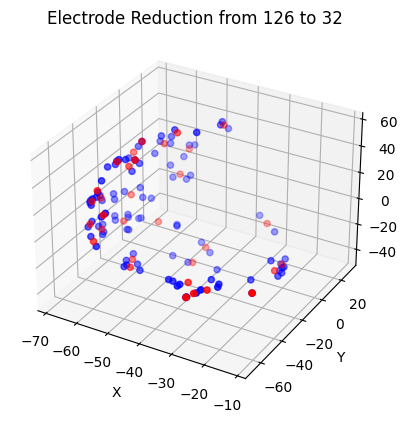

Reduced Electrode Positions:
[[-5.38192584e+01 -4.36045507e+01 -2.82530320e+01]
 [-3.46287352e+01 -4.58005098e+01 -2.39318186e+01]
 [-5.64267731e+01  1.84721053e+01  1.77729836e+01]
 [-6.45923443e+01 -9.89670849e+00  2.87319775e+01]
 [-5.78286209e+01 -2.06463985e+01  4.82523689e+01]
 [-2.68585863e+01 -5.14216671e+01 -1.94701319e+01]
 [-6.56635475e+01 -4.37208376e+01  1.38324814e+01]
 [-6.08608208e+01 -5.56988373e+01 -4.50213528e+00]
 [-4.55016670e+01 -1.03386326e+01 -4.35723979e+01]
 [-1.17276278e+01 -5.61787338e+01 -6.52857351e+00]
 [-2.78195553e+01 -6.05916901e+01 -1.56065822e+01]
 [-5.63693415e+01 -3.47600854e+01 -3.06883265e+01]
 [-5.14852867e+01 -6.62508949e+00  4.96331304e+01]
 [-6.11816702e+01 -3.32536712e+01  3.93516321e+01]
 [-2.79251099e+01 -6.70609589e+01 -1.35704069e+01]
 [-6.24069939e+01 -4.74161364e+01  2.66656774e+01]
 [-5.76971302e+01 -7.34222472e+00 -2.22759275e+01]
 [-4.47678719e+01  4.25919294e-02 -3.88380852e+01]
 [-6.51749490e+01 -1.83328020e+01 -1.91085900e+01]
 [

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.vq import kmeans, vq

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Plot original electrodes
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(electrodes[:, 0], electrodes[:, 1], electrodes[:, 2], color='b')

# Perform k-means clustering to reduce to 32 electrodes
centroids, _ = kmeans(electrodes, 32)
idx, _ = vq(electrodes, centroids)

# Plot reduced set of electrodes
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='r')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Electrode Reduction from 126 to 32')
plt.show()

# Print the coordinates of the reduced set of electrodes
print("Reduced Electrode Positions:")
print(centroids)


[[-6.12398552e+01 -2.90765739e+01  3.90434517e+01]
 [-5.50943000e+01 -3.91823181e+01 -2.94706793e+01]
 [-4.55206960e+01  1.92354867e+01  4.24328410e+01]
 [-2.80076804e+01 -6.11568766e+01 -1.59540172e+01]
 [-4.47678719e+01  4.25919294e-02 -3.88380852e+01]
 [-3.92969704e+01 -4.80516453e+01 -2.40723019e+01]
 [-2.91618748e+01 -3.72451859e+01 -2.60035191e+01]
 [-3.54273605e+01 -5.21046982e+01 -2.17196350e+01]
 [-5.69354286e+01 -3.71374474e+01  4.56622829e+01]
 [-5.75469627e+01 -5.54622860e+01  1.75175405e+01]
 [-6.42678817e+01 -4.53045371e+01  1.93324225e+01]
 [-4.81931858e+01 -8.57541037e+00  5.41602764e+01]
 [-6.36116199e+01 -5.26239724e+00  2.36168060e+01]
 [-6.08234355e+01 -1.75052484e+01  3.01207930e+01]
 [-2.52506714e+01 -4.64601669e+01 -1.99077663e+01]
 [-1.97634150e+01 -9.16123772e+00 -3.18747781e+01]
 [-6.32579269e+01 -5.08247843e+01 -3.17304855e+00]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-5.64267731e+01  1.84721053e+01  1.77729836e+01]
 [-6.77929573e+01 -2.50102978e+

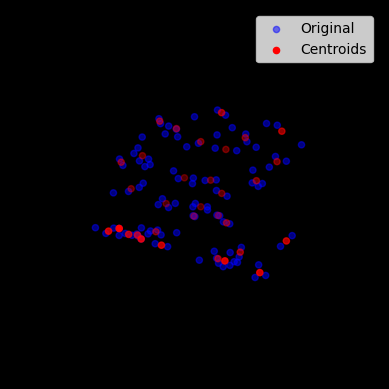

In [4]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.vq import kmeans, vq
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Perform k-means clustering to find 32 centroids
centroids, _ = kmeans(electrodes, 32)

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
print(centroids)
# Scatter plot for the original electrodes
ax.scatter(electrodes[:, 0], electrodes[:, 1], electrodes[:, 2], color='blue', alpha=0.5, label='Original')

# Scatter plot for the centroids
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='red', label='Centroids')

# Configure plot aesthetics
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
ax.legend()

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

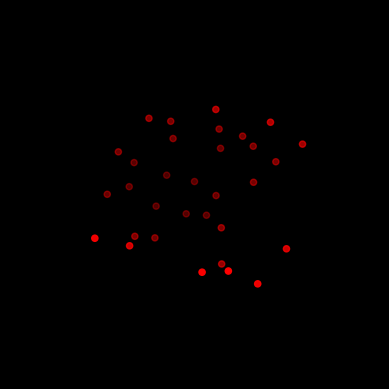

In [5]:
# Perform k-means clustering to find 32 centroids
centroids, _ = kmeans(electrodes, 32)

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for the centroids
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='red')

# Configure plot aesthetics
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())


[[-52.12558365  -5.79620481 -22.27792549]
 [-45.20814896  -6.18614278 -41.67867279]
 [-31.43538284  19.85951424 -24.88890171]
 [-61.72867298 -26.43471432  30.86359549]
 [-47.15329742  28.68864059  32.64619064]
 [-68.37722015 -29.09134579   4.28635222]
 [-65.65503311 -45.95073128  -1.84396182]
 [-65.11660099 -20.49016523 -19.58654141]
 [-65.72333145 -16.7308495    1.23675668]
 [-60.86082077 -55.69883728  -4.50213528]
 [-44.70439529  14.5089097   47.32616615]
 [-60.46298141 -50.63459625  23.00642262]
 [-22.44421705   6.79321273 -41.1067721 ]
 [-53.81925837 -43.60455068 -28.25303205]
 [-64.2801609  -11.45316005 -20.21330833]
 [-56.93542862 -37.13744736  45.66228294]
 [-63.61161995  -5.26239724  23.61680603]
 [-59.20627975   8.81582832  26.64385605]
 [-59.09001732   4.09770226  33.18046665]
 [-65.66354752 -43.72083759  13.83248138]
 [-56.42677307  18.47210534  17.77298355]
 [-33.28901182 -45.89474651 -23.35695403]
 [-60.59526634  -6.14277101  37.22648811]
 [-19.3032136   -5.6110816  -31.41

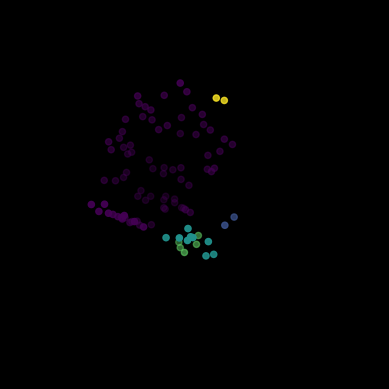

In [6]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])


# DBSCAN clustering
clustering = DBSCAN(eps=15, min_samples=2).fit(electrodes)
labels = clustering.labels_

# Positions for visualization are the points in each cluster
positions = electrodes[labels != -1]  # Exclude noise points if any

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], c=labels[labels != -1], cmap='viridis')
print(centroids)
# Remove grid and axis lines
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis

# Set limits for better control of the viewing area, if necessary
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])

# Set the background color
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

[[-52.12558365  -5.79620481 -22.27792549]
 [-45.20814896  -6.18614278 -41.67867279]
 [-31.43538284  19.85951424 -24.88890171]
 [-61.72867298 -26.43471432  30.86359549]
 [-47.15329742  28.68864059  32.64619064]
 [-68.37722015 -29.09134579   4.28635222]
 [-65.65503311 -45.95073128  -1.84396182]
 [-65.11660099 -20.49016523 -19.58654141]
 [-65.72333145 -16.7308495    1.23675668]
 [-60.86082077 -55.69883728  -4.50213528]
 [-44.70439529  14.5089097   47.32616615]
 [-60.46298141 -50.63459625  23.00642262]
 [-22.44421705   6.79321273 -41.1067721 ]
 [-53.81925837 -43.60455068 -28.25303205]
 [-64.2801609  -11.45316005 -20.21330833]
 [-56.93542862 -37.13744736  45.66228294]
 [-63.61161995  -5.26239724  23.61680603]
 [-59.20627975   8.81582832  26.64385605]
 [-59.09001732   4.09770226  33.18046665]
 [-65.66354752 -43.72083759  13.83248138]
 [-56.42677307  18.47210534  17.77298355]
 [-33.28901182 -45.89474651 -23.35695403]
 [-60.59526634  -6.14277101  37.22648811]
 [-19.3032136   -5.6110816  -31.41

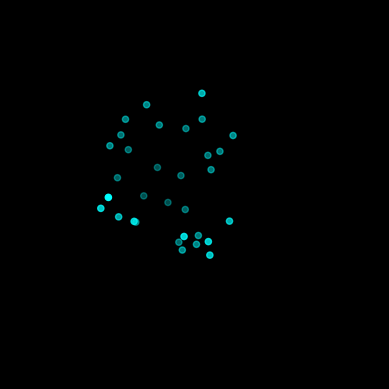

In [7]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# Define electrode positions
positions = np.array([
    [-59.40391604, -31.87375641, 42.341163],
    [-65.66354752, -43.72083759, 13.83248138],
    [-51.5124588, -11.66290092, -41.49539948],
    [-63.25792694, -50.82478428, -3.17304855],
    [-42.49627113, -9.67649841, -44.61089706],
    [-23.05419445, 7.13099909, -43.97796059],
    [-27.85814031, -40.31684621, -23.97160149],
    [-65.17494901, -18.33280198, -19.10858997],
    [-57.6971302, -7.34222472, -22.27592754],
    [-46.37048721, 0.7046715, -36.41254807],
    [-58.74309158, 7.24900675, 11.08596802],
    [-63.44809469, -6.69529626, 27.03591665],
    [-67.79295731, -25.01029778, 2.35935596],
    [-60.99863307, -23.78995895, 29.66102918],
    [-55.09429995, -39.18231805, -29.47067928],
    [-31.43538284, 19.85951424, -24.88890171],
    [-11.72762775, -56.17873383, -6.52857351],
    [-62.7822752, -9.96397805, -1.9716624],
    [-57.54696274, -55.462286, 17.51754045],
    [-19.76341502, -9.16123772, -31.87477811],
    [-37.36216545, -50.07817173, -22.89596844],
    [-43.1652565, -0.61948764, -41.26362228],
    [-21.22426224, 6.11764002, -35.36439514],
    [-57.00943756, 14.88790417, 13.78476715],
    [-62.75046921, -48.41915131, 23.41569519],
    [-28.00768042, -61.15687656, -15.95401716],
    [-55.20776367, 9.15022628, 2.77334845],
    [-61.72004318, -45.41010666, 33.16564178],
    [-53.14139303, 23.07235082, 24.06012472],
    [-58.86395073, 3.57169628, 33.39590693],
    [-66.50538635, -33.93398237, -15.12531233],
    [-46.44879055, 2.96674967, 50.74322128]
])


# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], color='cyan')
print(centroids)
# Remove grid and axis lines
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis

# Set limits for better control of the viewing area, if necessary
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])

# Set the background color
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

### 2 Use this to choose the channels, based on centroids

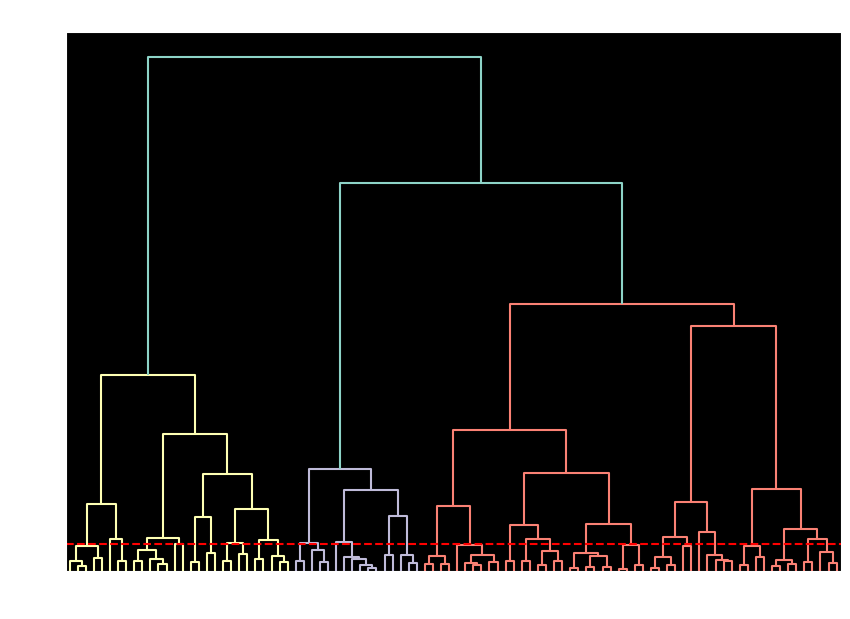

Number of clusters formed: 32
[[-5.62751640e+01  9.91751795e+00  6.63815610e+00]
 [-5.61354408e+01  2.02642059e+01  1.97670918e+01]
 [-4.71532974e+01  2.86886406e+01  3.26461906e+01]
 [-6.16746635e+01 -3.22859821e+01  3.79802750e+01]
 [-5.58484077e+01 -2.91139269e+01  4.83202248e+01]
 [-4.47043953e+01  1.45089097e+01  4.73261662e+01]
 [-4.81931858e+01 -8.57541037e+00  5.41602764e+01]
 [-5.96746311e+01 -2.14773254e+01  2.82441206e+01]
 [-6.45923443e+01 -9.89670849e+00  2.87319775e+01]
 [-5.75661621e+01  4.43123341e-01  3.85660591e+01]
 [-6.04943581e+01  4.36935555e+00  2.66984348e+01]
 [-4.47678719e+01  4.25919294e-02 -3.88380852e+01]
 [-4.55016670e+01 -1.03386326e+01 -4.35723979e+01]
 [-1.89995308e+01 -6.92132874e+00 -3.16005363e+01]
 [-2.35828362e+01 -2.03607826e+01 -3.32459869e+01]
 [-3.14353828e+01  1.98595142e+01 -2.48889017e+01]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-6.65053864e+01 -3.39339824e+01 -1.51253123e+01]
 [-5.50943000e+01 -3.91823181e+01 -2.94706793e+01]
 

/tmp/ipykernel_2329/1235004596.py:139: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], cmap='viridis')


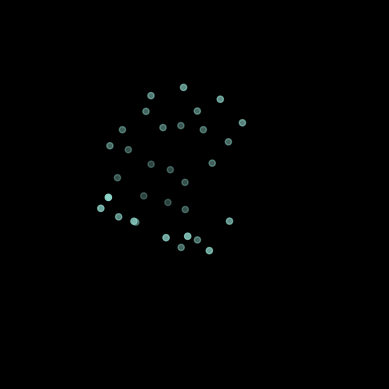

In [8]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    #[-27.0217590332031, -40.117847442627, -23.9372749328613], # A2 (omitted because its a ref)
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Perform hierarchical clustering
Z = linkage(electrodes, 'ward')  # 'ward' method minimizes the variance within clusters

# Plot the dendrogram to determine a suitable cut-off
plt.figure(figsize=(10, 7))
plt.style.use('dark_background')  # Set background color to black
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Electrode Index')
plt.ylabel('Distance')
plt.axhline(y=17.5, color='r', linestyle='--')  # Example line to visualize the current cut-off
plt.show()

# Experiment with this value to get approximately 32 clusters:
cut_off_distance = 17.5  # You might need to adjust this based on the dendrogram

# Form flat clusters
clusters = fcluster(Z, cut_off_distance, criterion='distance')

# Calculate the number of clusters and adjust if necessary
actual_number_of_clusters = len(np.unique(clusters))
print(f"Number of clusters formed: {actual_number_of_clusters}")
# Calculate centroids of these clusters
centroids = np.array([electrodes[clusters == k].mean(axis=0) for k in np.unique(clusters)])
print(centroids)

# Create a 3D figure for visualization
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], cmap='viridis')

# Configure plot aesthetics
ax.grid(False)
ax.axis('off')
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())


### 3 match the centroids we found to the actual ecog channels in the dataset

In [9]:
import numpy as np
from scipy.spatial import cKDTree

# Given electrode positions and their names
# Electrode positions
electrode_positions = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    #[-27.0217590332031, -40.117847442627, -23.9372749328613], # A2 (omitted because its a ref)
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Electrode names corresponding to the positions in electrode_positions
electrode_names = [
    "A1", "A10", "A11", "A12", "A13", "A14", "A15", "A16",
    "A17", "A18", "A19", "A20", "A21", "A22", "A23",
    "A24", "A25", "A26", "A27", "A28", "A29", "A3", "A30",
    "A31", "A32", "A33", "A34", "A35", "A36", "A37", "A38",
    "A39", "A4", "A40", "A41", "A42", "A43", "A44", "A45",
    "A46", "A47", "A48", "A49", "A5", "A6", "A7", "A8",
    "A9", "B12", "B13", "B14", "B15", "B16", "B17", "B18",
    "B19", "B20", "B21", "B22", "B23", "B24", "B25", "B26",
    "B27", "B28", "B29", "B30", "B31", "B32", "B33", "B34",
    "B35", "B36", "B37", "B38", "B39", "B4", "B40", "B41",
    "B42", "B43", "B44", "B45", "B46", "B47", "B48", "B49",
    "B5", "B50", "B51", "B52", "B53", "B54", "B55", "B56",
    "B57", "B58", "B59", "B6", "B60", "B61", "B62", "B63",
    "B64", "B7", "B8", "B9"
]


# Create a KD-tree for quick nearest-neighbor lookup
tree = cKDTree(electrode_positions)

# Find the closest electrode for each centroid
distances, indices = tree.query(centroids, k=1)

# Map centroids to electrode names using the indices
matched_names = [electrode_names[idx] for idx in indices]

# Output matched names
for centroid, name in zip(centroids, matched_names):
    print(f"Centroid {centroid} matched to Electrode {name}")

# Optionally, you can also inspect the distance to confirm a good match
for dist, name in zip(distances, matched_names):
    print(f"Electrode {name} with distance {dist:.2f}")

# Count the number of matched electrodes
num_matched_electrodes = len(matched_names)

# Output the number of matched electrodes
print(f"Number of matched electrodes: {num_matched_electrodes}")


Centroid [-56.27516403   9.91751795   6.6381561 ] matched to Electrode B21
Centroid [-56.13544083  20.26420593  19.76709175] matched to Electrode A48
Centroid [-47.15329742  28.68864059  32.64619064] matched to Electrode B56
Centroid [-61.67466354 -32.28598213  37.98027496] matched to Electrode A5
Centroid [-55.84840775 -29.11392689  48.32022476] matched to Electrode B57
Centroid [-44.70439529  14.5089097   47.32616615] matched to Electrode B55
Centroid [-48.19318581  -8.57541037  54.16027641] matched to Electrode B4
Centroid [-59.67463112 -21.47732544  28.2441206 ] matched to Electrode B17
Centroid [-64.59234428  -9.89670849  28.73197746] matched to Electrode B18
Centroid [-57.56616211   0.44312334  38.56605911] matched to Electrode A46
Centroid [-60.49435806   4.36935555  26.69843483] matched to Electrode A9
Centroid [-4.47678719e+01  4.25919294e-02 -3.88380852e+01] matched to Electrode A16
Centroid [-45.50166702 -10.33863258 -43.57239787] matched to Electrode A18
Centroid [-18.99953

### 4 Plot to check the signals

Extracting EDF parameters from /home/jovyan/biosilicon-6-datavol-1/Bio-Silicon-Synergetic-Intelligence-System/Software/CNN_feature_extraction_project/datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1898115  =      0.000 ...  1898.115 secs...
Adjusted matched names: ['POL B21', 'POL A48', 'POL B56', 'POL A5', 'POL B57', 'POL B55', 'POL B4', 'POL B17', 'POL B18', 'POL A46', 'POL A9', 'POL A16', 'POL A18', 'POL A12', 'POL A39', 'POL A43', 'POL A13', 'POL B51', 'POL A38', 'POL B25', 'POL B37', 'POL B36', 'POL B44', 'POL B54', 'POL A34', 'POL A3', 'POL A24', 'POL A31', 'POL B48', 'POL B33', 'POL B40', 'POL B22']
Number of plots plotted: 32


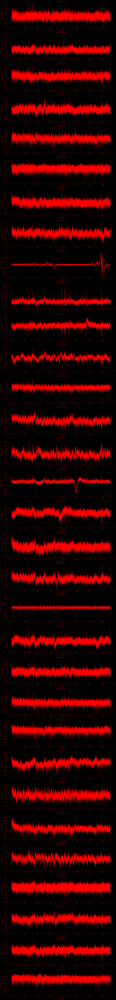

In [10]:
import pyedflib
import mne
import matplotlib.pyplot as plt
import numpy as np

# Path to your EDF file
file_path = '../datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf'

# Load the EDF file
raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)

# Electrode names matched to centroids (retrieved from your earlier analysis)
matched_names = ['B21', 'A48', 'B56', 'A5', 'B57', 'B55', 'B4', 'B17', 'B18', 'A46', 'A9', 'A16', 'A18', 'A12', 'A39', 'A43', 'A13', 'B51', 'A38', 'B25', 'B37', 'B36', 'B44', 'B54', 'A34', 'A3', 'A24', 'A31', 'B48', 'B33', 'B40', 'B22']

# Function to generate the corresponding channel names with the "POL" prefix
def generate_pol_channel_name(name):
    if name.startswith('POL'):
        return name
    elif name.startswith('EEG'):
        return f'POL {name[4:]}'
    else:
        # Handle other prefixes as needed
        return f'POL {name}'  # Assuming other prefixes can be safely prefixed with "POL"

# Adjusted matched names with "POL" prefix
adjusted_matched_names = [generate_pol_channel_name(name) for name in matched_names]

print("Adjusted matched names:", adjusted_matched_names)

# Filter to keep only the indices of channels that are in adjusted_matched_names
indices = [raw.ch_names.index(name) for name in adjusted_matched_names if name in raw.ch_names]

print("Number of plots plotted:", len(indices))  # Print the number of plots plotted

# Extract data for these channels
selected_data, times = raw[indices, :]

# Plotting
plt.figure(figsize=(15, 4 * len(indices)), facecolor='black')
for i, idx in enumerate(indices):
    plt.subplot(len(indices), 1, i + 1)
    plt.plot(times, selected_data[i], color='red', linewidth=0.5)
    plt.title(f'Channel {raw.ch_names[idx]}', color='red', fontsize=10)
    plt.xlabel('Time (s)', color='red')
    plt.ylabel('Amplitude (µV)', color='red')
    plt.xticks(color='red')
    plt.yticks(color='red')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_color('red')
    plt.gca().spines['left'].set_color('red')
    plt.gca().set_facecolor('black')

plt.tight_layout()
plt.show()


### Remove the "POL " from each channel name and save each channel as npy

In [11]:
import numpy as np

# Assuming 'selected_data' contains the data for channels and 'adjusted_matched_names' contains the channel names like "POL A62"
clean_names = [name[4:] for name in adjusted_matched_names]  # List comprehension to strip the first four characters from each name

# Save both the channel names and the data to a .npz file
np.savez('../datasets/interim/all_channels_data.npz', data=selected_data, names=clean_names)

### See what the channels are named

In [12]:
print(raw.ch_names)  # Print the first 30 channel names to get an idea of the naming format

matched_names = ['B21', 'A47', 'B56', 'A5', 'B57', 'B55', 'B4', 'B17', 'B18', 'A46', 'A9', 'A16', 'A18', 'A12', 'A39', 'A10', 'A13', 'A24', 'A31', 'A34', 'A2', 'B48', 'B33', 'B40', 'B22', 'B51', 'A38', 'B25', 'B37', 'B36', 'B44', 'B54']


['EEG A1-Ref', 'EEG A2-Ref', 'POL A3', 'POL A4', 'POL A5', 'POL A6', 'POL A7', 'POL A8', 'POL A9', 'POL A10', 'POL A13', 'POL A14', 'POL A15', 'POL A16', 'POL A17', 'POL A18', 'POL A19', 'POL A20', 'POL A21', 'POL E', 'POL A22', 'POL A23', 'POL A11', 'POL A12', 'POL A24', 'POL A25', 'POL A26', 'POL A27', 'POL A28', 'POL A29', 'POL A30', 'POL A31', 'POL A32', 'POL A33', 'POL A34', 'POL A35', 'POL A36', 'POL DC01', 'POL DC02', 'POL DC03', 'POL DC04', 'POL SPO2', 'POL A37', 'POL A38', 'POL $A11', 'POL $A12', 'POL A39', 'POL A40', 'POL A41', 'POL A42', 'POL A43', 'POL A44', 'POL A45', 'POL A46', 'POL A47', 'POL A48', 'POL A49', 'POL A50', 'POL B1', 'POL B2', 'POL B3', 'POL B4', 'POL B5', 'POL B6', 'POL B7', 'POL B8', 'POL B9', 'POL B10', 'POL B11', 'POL B12', 'POL B13', 'POL B14', 'POL B15', 'POL B16', 'POL B17', 'POL B18', 'POL B19', 'POL B20', 'POL B21', 'POL B22', 'POL B23', 'POL B24', 'POL B25', 'POL B26', 'POL B27', 'POL B28', 'POL B29', 'POL B30', 'POL B31', 'POL B32', 'POL B33', 'PO

## Shuffleboard Online Features to Actions Dataset Creation

### Motivation 
We have a number of  features that are currently not incorporated into the BSSIS system beacuse of how slow they are to calculate; we call these offline features, which are fully listed in the ticket documenting this effort. 

Including them in the system would allow additional ways for the biological system to influence the game world, and allow for additional analysis of the BCI system as a whole in terms of these features.

### Dataset 
 
Actions in the Shuffleboard game are determined by whether or not the average value of extracted features from latest block of neural signal data increasing or decreasing in comparison to the previous block of neural signal data. Hence, to predict actions, we can try to predict whether or not the extracted feature increased, which is a binary classification setup. To start, we will predict increases or decreases of online features, so that we can get an idea of how well this would work on offline features. 

- Input: 500ms worth of neural data, where the first 250ms is the previous block and the next 250ms is the latest block
- Output: 1/0 representing whether or not the extracted feature increased. 

In [13]:
%%capture 

import numpy as np
from scipy.signal import find_peaks, welch, hilbert
from scipy.fft import fft, fftfreq
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw  
from PyEMD import EMD
import torch
from torch.utils.data import DataLoader, TensorDataset, random_split
import os

# Peak detection function
def detect_peaks(signal):
    median_height = np.median(signal)
    std_height = np.std(signal)
    height = median_height + std_height  # Setting height to be above median + 1 std deviation
    distance = len(signal) * 0.05  # Example to set distance to 5% of signal length
    prominence = std_height * 0.5  # Setting prominence to be half of std deviation
    
    # Detecting peaks
    peaks, properties = find_peaks(signal, height=height, distance=distance, prominence=prominence)
    
    peak_count = len(peaks)
    average_peak_height = np.mean(properties["peak_heights"]) if "peak_heights" in properties else 0
    average_distance = np.mean(np.diff(peaks)) if len(peaks) > 1 else 0
    average_prominence = np.mean(properties["prominences"]) if "prominences" in properties else 0

    return {
        "peak_counts": peak_count,
        "average_peak_height": average_peak_height,
        "average_distance": average_distance,
        "average_prominence": average_prominence,
    }

# Calculate variance and standard deviation
def calculate_variance_std_dev(signal):
    variance = np.var(signal)
    std_dev = np.std(signal)
    return variance, std_dev

# Calculate RMS
def calculate_rms(signal):
    rms = np.sqrt(np.mean(signal**2))
    return rms

# Frequency bands and PSD
def freq_bands(signal, fs=500):
    band_features = {}
    frequencies, psd = welch(signal, fs=fs, nperseg=min(32, len(signal)))
    bands = {'delta': (1, 4), 'theta': (4, 8), 'alpha': (8, 13), 'beta': (13, 30)}
    for name, (low, high) in bands.items():
        idx = np.logical_and(frequencies >= low, frequencies <= high)
        band_features[f'{name}_band_power'] = np.mean(psd[idx])
    return band_features, frequencies, psd

# Calculate spectral entropy
def calculate_spectral_entropy(signal, fs=500):
    frequencies, psd = welch(signal, fs=fs, nperseg=min(len(signal), fs * 2))
    normalized_psd = psd / np.sum(psd)
    spectral_entropy = -np.sum(normalized_psd * np.log2(normalized_psd))
    return spectral_entropy

# Spectral centroids
def spectral_centroids(signal, fs=500):
    fft_result = fft(signal)
    frequencies = fftfreq(len(signal), 1.0/fs)
    magnitude = np.abs(fft_result)
    centroid = np.sum(frequencies * magnitude) / np.sum(magnitude)
    return centroid

# Spectral edge density
def spectral_edge_density(signal, fs=500, percentage=95):
    fft_result = fft(signal)
    frequencies = fftfreq(len(signal), 1.0/fs)
    positive_frequencies = frequencies[frequencies >= 0]
    positive_fft_result = np.abs(fft_result[frequencies >= 0])
    cumulative_sum = np.cumsum(np.sort(positive_fft_result)[::-1])
    total_power = np.sum(positive_fft_result)
    threshold = total_power * (percentage / 100)
    spectral_edge = positive_frequencies[np.argmax(cumulative_sum >= threshold)]
    return spectral_edge

# Phase locking values
def phase_locking_values(signals):
    num_signals = signals.shape[0]
    plv_matrix = np.zeros((num_signals, num_signals))
    for i in range(num_signals):
        for j in range(i+1, num_signals):  # Only compute for unique pairs
            signal1 = signals[i]
            signal2 = signals[j]
            analytic_signal1 = hilbert(signal1)
            analytic_signal2 = hilbert(signal2)
            phase1 = np.angle(analytic_signal1)
            phase2 = np.angle(analytic_signal2)
            phase_diff = phase1 - phase2
            plv = np.abs(np.sum(np.exp(1j * phase_diff)) / len(signal1))
            plv_matrix[i, j] = plv
            plv_matrix[j, i] = plv  # PLV is symmetric
    return plv_matrix

# Higuchi Fractal Dimension
def calculate_higuchi_fractal_dimension(signal, k_max=10):
    hfd_values = []
    N = len(signal)
    L = []
    x = np.asarray(signal)
    for k in range(1, k_max + 1):
        Lk = []
        for m in range(k):
            Lkm_sum = 0
            max_index = int((N - m - 1) / k) + 1  # Ensures valid indexing
            for i in range(1, max_index):
                Lkm_sum += abs(x[m + i*k] - x[m + (i-1)*k])
            if max_index - 1 > 0:  # Check to avoid division by zero
                Lkm = Lkm_sum * (N - 1) / (k * (max_index - 1))
                Lk.append(Lkm)
            else:
                Lk.append(0)  # Or handle appropriately
        if np.mean(Lk) > 0:
            L.append(np.log(np.mean(Lk)))
        else:
            L.append(np.log(np.finfo(float).eps))  # Using machine epsilon for a small positive number
    if len(L) > 0 and np.all(np.isfinite(L)):
        hfd = np.polyfit(np.log(range(1, k_max + 1)), L, 1)[0]  # Linear fit to log-log plot
        hfd_values.append(hfd)
    else:
        hfd_values.append(np.nan)  # Append NaN or another placeholder to indicate failure
    return hfd_values

# Zero Crossing Rate
def calculate_zero_crossing_rate(signal):
    sign_changes = np.diff(np.sign(signal))
    zero_crossings = np.count_nonzero(sign_changes)
    zero_crossing_rate = zero_crossings / (len(signal) - 1)
    return zero_crossing_rate

# Time Warping Factor
def time_warping_factor(signals):
    average_signal = np.mean(signals, axis=0)
    warping_factors = []
    for signal in signals:
        signal = np.squeeze(signal)
        average_signal = np.squeeze(average_signal)
        distance, _ = fastdtw(signal, average_signal, dist=euclidean)
        warping_factors.append(distance)
    return warping_factors

# Evolution Rate
def evolution_rate(signal):
    analytic_signal = hilbert(signal)
    envelope = np.abs(analytic_signal)
    derivative = np.diff(envelope)
    rate = np.mean(np.abs(derivative))
    return rate

# Constants
ORIGINAL_SAMPLING_RATE = 1000  # Original sampling rate of the data
TARGET_SAMPLING_RATE = 500  # Target sampling rate after subsampling; this is the effective sampling rate of the live system
WINDOW_SIZE_MS = 250

# Initial Data Preparation
def preprocess_data(data, target_freq=TARGET_SAMPLING_RATE, window_size_ms=WINDOW_SIZE_MS):
    num_channels, num_samples = data.shape
    original_freq = ORIGINAL_SAMPLING_RATE  # Original sampling frequency (1000Hz)
    
    # Subsample the data to the target frequency
    subsampling_factor = original_freq // target_freq
    subsampled_data = data[:, ::subsampling_factor]
    
    # Calculate the window size and stride in samples
    window_size_samples = int(window_size_ms * target_freq / ORIGINAL_SAMPLING_RATE)
    stride_samples = window_size_samples
    
    # Create buckets of data
    num_subsampled_samples = subsampled_data.shape[1]
    num_buckets = (num_subsampled_samples - window_size_samples) // stride_samples + 1
    
    buckets = np.zeros((num_buckets, num_channels, window_size_samples))
    for i in range(num_buckets):
        start = i * stride_samples
        end = start + window_size_samples
        buckets[i] = subsampled_data[:, start:end]
    
    return buckets

# Normalize the data to the range [0, 1]
def normalize_data(data):
    data_min = np.min(data, axis=(0, 2), keepdims=True)
    data_max = np.max(data, axis=(0, 2), keepdims=True)
    normalized_data = (data - data_min) / (data_max - data_min)
    return normalized_data

# Extract features function
def extract_features(signals, fs=500):
    features_list = []
    
    for signal in signals:
        features = {}
        
        peaks_results = detect_peaks(signal)
        variance, std_dev = calculate_variance_std_dev(signal)
        rms = calculate_rms(signal)
        band_features, frequencies, psd = freq_bands(signal, fs)
        spectral_entropy = calculate_spectral_entropy(signal, fs)
        centroid = spectral_centroids(signal, fs)
        spectral_edge = spectral_edge_density(signal, fs)
        plv = phase_locking_values(np.expand_dims(signal, axis=0))  # Make sure PLV gets the right shape
        hfd_values = calculate_higuchi_fractal_dimension(signal)
        zero_crossing_rate = calculate_zero_crossing_rate(signal)
        rate = evolution_rate(signal)
        
        features.update({
            "peak_height": peaks_results.get('peak_heights', []),
            "peak_counts": peaks_results['peak_counts'],
            "average_peak_height": peaks_results['average_peak_height'],
            "average_distance": peaks_results['average_distance'],
            "average_prominence": peaks_results['average_prominence'],
            "variance": variance,
            "std_dev": std_dev,
            "rms": rms,
            "delta_band_power": band_features['delta_band_power'],
            "theta_band_power": band_features['theta_band_power'],
            "alpha_band_power": band_features['alpha_band_power'],
            "beta_band_power": band_features['beta_band_power'],
            "spectral_entropy": spectral_entropy,
            "fft_results": fft(signal),
            "magnitudes": np.abs(fft(signal)),
            "centroids": centroid,
            "spectral_edge_density": spectral_edge,
            "phases": np.angle(hilbert(signal)),
            "pairwise_phase_locking_values": plv,
            "higuchi_fractal_dimension": hfd_values[0],
            "zero_crossing_rate": zero_crossing_rate,
            "IMFS": [],  # Placeholder for IMFs
            "signal_shapes": signal.shape,
            "average_signal_shapes": np.mean(signal),
            "evolution_rate": rate,
            "analytic_signals": hilbert(signal),
            "envelopes": np.abs(hilbert(signal)),
            "derivatives": np.diff(np.abs(hilbert(signal))),
        })
        
        features_list.append(features)
    
    return features_list, frequencies, psd

# used to create inputs of consecutive blocks (250ms+250ms) as input 
def combine_blocks(normalized_buckets):
    num_blocks, num_channels, samples_per_block = normalized_buckets.shape
    combined_blocks = np.zeros((num_blocks - 1, num_channels, samples_per_block * 2))
    
    for i in range(num_blocks - 1):
        combined_blocks[i] = np.concatenate((normalized_buckets[i], normalized_buckets[i + 1]), axis=1)
    
    return combined_blocks

# Load the data
loaded_data = np.load('../datasets/interim/all_channels_data.npz')
selected_data = loaded_data['data']
clean_names = loaded_data['names']

# Create channel info dictionary
channel_info = {
    "names": clean_names,
    "num_channels": len(clean_names)
}

# Preprocess the data into buckets
buckets = preprocess_data(selected_data)

# Normalize the data to the range [0, 1]
normalized_buckets = normalize_data(buckets)

# Create 500ms blocks of consecutive blocks as our input data
normalized_consecutive_buckets = combine_blocks(normalized_buckets)

# Save normalized neural data as .npz file (this will be used to generate the output labels later)
np.savez('../datasets/interim/shuffleboard_normalized_neural_data_all_channels_500hz_250ms_buckets',  data=normalized_buckets)

# Save combined consecutive blocks of 500ms as .npz file (these are our actual inputs)
np.savez('../datasets/processed/shuffleboard/normalized_dataset_500hz_500ms_consecutive_buckets',  data=normalized_consecutive_buckets)

### Extract Features

In [14]:
# Extract features from windows 
features_list = []
for window in normalized_buckets:
    features, frequencies, psd = extract_features(window)
    features_list.append(features)

/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_2329/518281860.py:58: RuntimeWarning: invalid value encountered in true_divide
  normalized_psd = psd / np.sum(psd)


### Create Tensors

In [15]:
# Define thresholds for specific features based on provided mappings
def preprocess_features(features_list):
    # Initialize dictionaries to store features and labels
    all_features = {key: [] for key in features_list[0][0].keys()}
    binary_labels = {key: [] for key in features_list[0][0].keys()}
    
    # Initialize dictionary to store previous average values
    prev_avg_values = {key: None for key in features_list[0][0].keys()}
    
    # Iterate through each segment (time block) in the features list
    for segment_idx, segment in enumerate(features_list):
        segment_features = {key: [] for key in all_features.keys()}
        
        # Extract features for each channel in the segment
        for channel in segment:
            if isinstance(channel, dict):
                for key, value in channel.items():
                    if isinstance(value, np.ndarray):
                        segment_features[key].append(value)
                    else:
                        segment_features[key].append(np.array([value]))
        
        # Process each feature
        for key in segment_features.keys():
            # Stack features from all channels
            stacked_features = np.stack(segment_features[key], axis=0)
            all_features[key].append(stacked_features)
            
            # Calculate current average value for this feature
            current_avg = np.mean(stacked_features)
            
            # Generate binary label only if there's a previous segment
            if prev_avg_values[key] is not None:
                binary_labels[key].append(int(current_avg > prev_avg_values[key]))
            
            # Update previous average value for next iteration
            prev_avg_values[key] = current_avg
    
    # Convert lists to numpy arrays
    for key in all_features.keys():
        all_features[key] = np.array(all_features[key])
        binary_labels[key] = np.array(binary_labels[key])
    
    return all_features, binary_labels

# Convert the features to a tensor dictionary
features_dict, binary_labels_dict = preprocess_features(features_list)
tensor_dict = {key: torch.tensor(features_dict[key], dtype=torch.float32) for key in features_dict.keys()}
labels_dict = {key: torch.tensor(binary_labels_dict[key], dtype=torch.float32) for key in binary_labels_dict.keys()}

# Save the tensors
save_dir = '../datasets/interim/'
#os.makedirs(save_dir, exist_ok=True)
for key, tensor in tensor_dict.items():
    torch.save(tensor, os.path.join(save_dir, f'shuffleboard_{key}_250ms_500hz_tensor.pt'))
save_dir = '../datasets/processed/shuffleboard/'
for key, label in labels_dict.items():
    torch.save(label, os.path.join(save_dir, f'{key}_labels_500ms_500hz_tensor.pt'))

print(f"All tensors have been saved in {save_dir}.")

# Load and print all tensors and their shapes
for key in tensor_dict.keys():
    if key in labels_dict:
        labels = torch.load(os.path.join(save_dir, f'{key}_labels_500ms_500hz_tensor.pt'))
        print(f'Tensor name: {key}_labels, Tensor shape: {labels.shape}')

/tmp/ipykernel_2329/1182349743.py:48: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at  /pytorch/aten/src/ATen/native/Copy.cpp:219.)
  tensor_dict = {key: torch.tensor(features_dict[key], dtype=torch.float32) for key in features_dict.keys()}


All tensors have been saved in ../datasets/processed/shuffleboard/.
Tensor name: peak_height_labels, Tensor shape: torch.Size([7591])
Tensor name: peak_counts_labels, Tensor shape: torch.Size([7591])
Tensor name: average_peak_height_labels, Tensor shape: torch.Size([7591])
Tensor name: average_distance_labels, Tensor shape: torch.Size([7591])
Tensor name: average_prominence_labels, Tensor shape: torch.Size([7591])
Tensor name: variance_labels, Tensor shape: torch.Size([7591])
Tensor name: std_dev_labels, Tensor shape: torch.Size([7591])
Tensor name: rms_labels, Tensor shape: torch.Size([7591])
Tensor name: delta_band_power_labels, Tensor shape: torch.Size([7591])
Tensor name: theta_band_power_labels, Tensor shape: torch.Size([7591])
Tensor name: alpha_band_power_labels, Tensor shape: torch.Size([7591])
Tensor name: beta_band_power_labels, Tensor shape: torch.Size([7591])
Tensor name: spectral_entropy_labels, Tensor shape: torch.Size([7591])
Tensor name: fft_results_labels, Tensor shape

# Check Distribution of Labels

Amount of labels for feature 'spectral_edge_density': 7591
Label distribution:
Label 0.0: 3793 occurrences (49.97%)
Label 1.0: 3798 occurrences (50.03%)


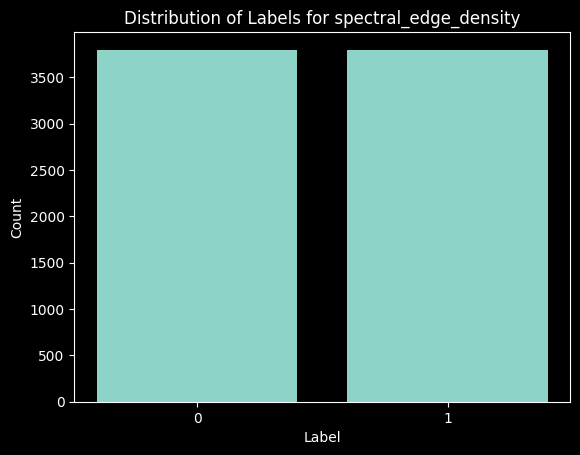


Total number of labels: 7591
Number of unique labels: 2
Most common label: 1.0 (occurs 3798 times)
Least common label: 0.0 (occurs 3793 times)


In [20]:
import torch
import matplotlib.pyplot as plt

feature_name = 'spectral_edge_density'

# Load the labels for feature
save_dir = '../datasets/processed/shuffleboard/'
labels = torch.load(os.path.join(save_dir, f'{feature_name}_labels_250ms_500hz_tensor.pt'))

labels_np = labels.numpy()

unique, counts = np.unique(labels_np, return_counts=True)


print(f"Amount of labels for feature '{feature_name}': {len(labels)}")
print("Label distribution:")
for label, count in zip(unique, counts):
    print(f"Label {label}: {count} occurrences ({count/len(labels_np)*100:.2f}%)")

plt.bar(unique, counts)
plt.title(f"Distribution of Labels for {feature_name}")
plt.xlabel("Label")
plt.ylabel("Count")
plt.xticks(unique)
plt.show()

print(f"\nTotal number of labels: {len(labels_np)}")
print(f"Number of unique labels: {len(unique)}")
print(f"Most common label: {unique[np.argmax(counts)]} (occurs {np.max(counts)} times)")
print(f"Least common label: {unique[np.argmin(counts)]} (occurs {np.min(counts)} times)")

# Check that # of signal blocks match number of labels

In [21]:
consecutive_buckets = np.load('../datasets/processed/shuffleboard/normalized_dataset_500hz_500ms_consecutive_buckets.npz')
data = consecutive_buckets['data']

print(f"Shape of consecutive buckets: {data.shape}")
print(f"Number of consecutive bucket pairs: {data.shape[0]}")

Shape of consecutive buckets: (7591, 32, 250)
Number of consecutive bucket pairs: 7591


In [22]:
import torch
import numpy as np

# Load signal data
signal_data = np.load('../datasets/processed/shuffleboard/normalized_dataset_500hz_500ms_consecutive_buckets.npz')
X = torch.tensor(signal_data['data'], dtype=torch.float32)

# Load labels for a specific feature (e.g., 'rms')
feature_name = 'rms'
y = torch.load(f'../datasets/processed/shuffleboard/{feature_name}_labels_500ms_500hz_tensor.pt')

print(f"Signal data shape: {X.shape}")
print(f"Labels shape: {y.shape}")



Signal data shape: torch.Size([7591, 32, 250])
Labels shape: torch.Size([7591])
